# Harry Potter and Maze of the Triwizard Cup

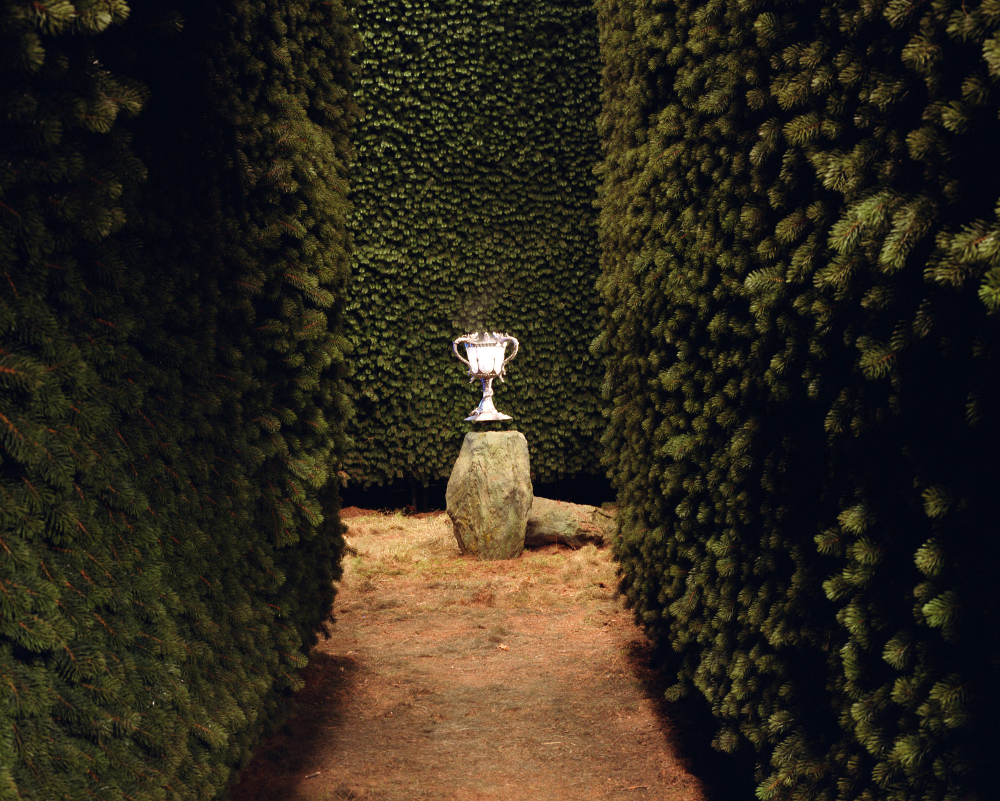

In the final task of the Triwizard Tournament, Harry Potter has successfully found the Twizard Cup in the middle of the maze, but the challenge is not over yet. With the Cup in his hands, he must now find his way out of the maze. Harry must navigate through the twisting paths and avoid dead ends to reach safety.

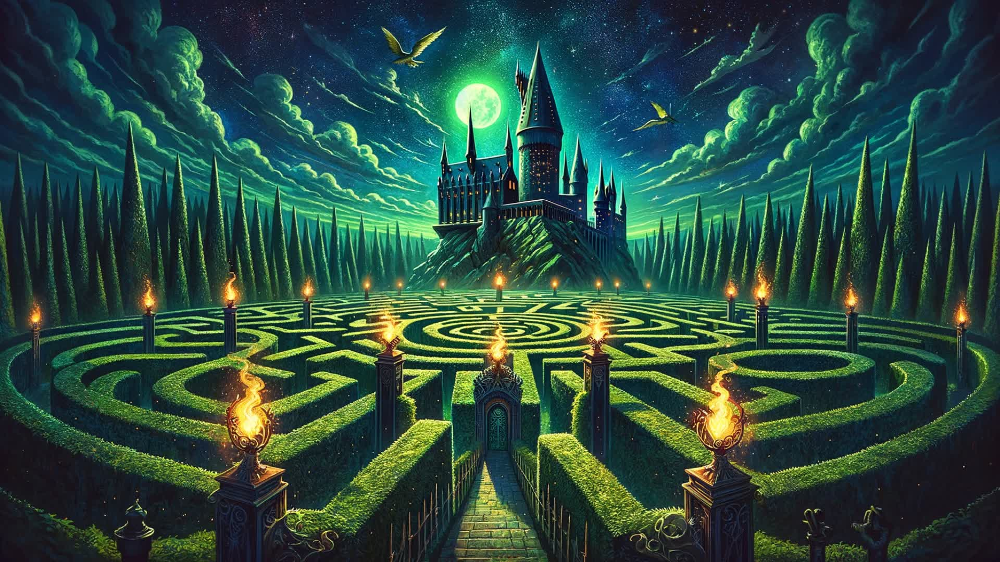


As he stands in the middle of the maze, Harry takes a deep breath and prepares to make his way to the exit. The hedges loom high above him, and the paths are fraught with obstacles. With determination and his trusty wand, Harry begins his journey to escape the maze.

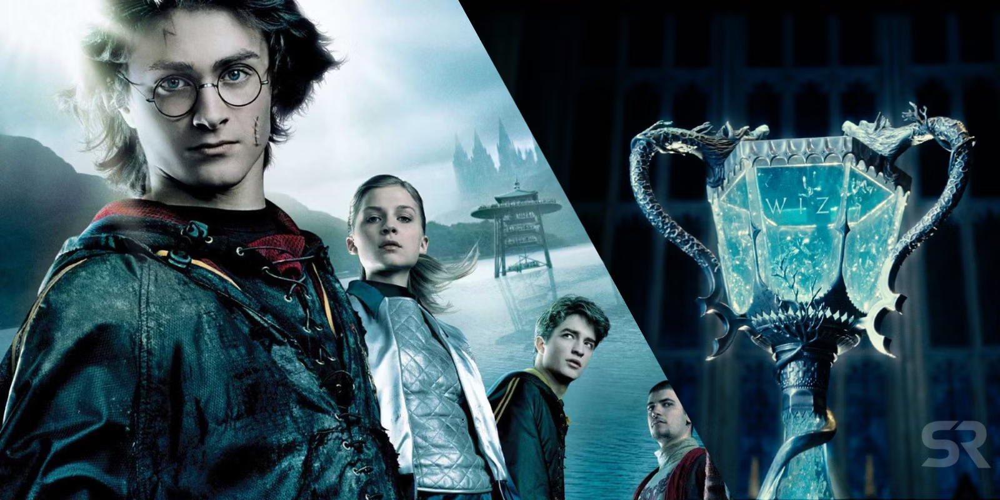


Can you help Harry to find the way out and secure his victory in the Triwizard Tournament?

# Steps
* determine what the Maze looks like
* find free neighbours cells
* find route
* leave the Maze

## Determine what the Maze looks like

Implement a `print_map` function that takes as input a **Boolean matrix map of the maze** and a **Harry position** and displays an ASCII image of the maze in the following format:
* the "@" symbol corresponds to the cell in which Harry is located
* free cells for which the value True is written in the matrix corresponds to
symbol "."
* occupied cells - "#"

In [3]:
def print_map(m, pos):
    c = [[0]*len(m) for _ in range(len(m))]
    for i in range(len(m)):
        for j in range(len(m)):
            if (i, j) == pos:
                c[i][j] = "@"
            elif m[i][j] is True:
                c[i][j] = "."
            else:
                c[i][j] = "#"
    for r in c:
        print(" ".join(r))

In [60]:
m = [[False, False, False, False],
     [False, True, False, True],
     [False, True, False, True],
     [True, True, False, False]]

In [61]:
print_map(m, (2, 1))

# # # #
# . # .
# @ # .
. . # #


Expected output:<br>
`####`<br>
`#.#.`<br>
`#@#.`<br>
`..##`<br>

**HINT:**
You might find the `shape` function useful, which returns a pair whose first element is the number of rows in the given matrix, and the second element is the number of columns:

In [6]:
def shape(m):
    return len(m), len(m[0])

In [7]:
shape([[True, False]])

(1, 2)

In [8]:
shape(m)

(4, 4)

## Find free neighbours cells

The **neighbors** of a cell on the maze map will be the free cells located to the left, right, above or below the one. Write a function `neighbors` that takes a **map of the maze** and the **position of a cell** on it and returns a list of its neighbors.

In [74]:
def neighbours(m, pos):
    x, y = pos
    possible_cells = [(x-1, y), (x+1, y), (x, y-1), (x, y+1)]
    free_cells = [cell for cell in possible_cells if 0 <= cell[0] < len(m) and 0 <= cell[1] < len(m[0]) and m[cell[0]][cell[1]] is True]
    return free_cells

In [75]:
neighbours(m, (0, 0))

[]

Expected output:<br>
`[]`

In [76]:
neighbours(m, (2, 1))

[(1, 1), (3, 1)]

Expected output:<br>
`[(3, 1), (1, 1)]`

## Find route

Implement the `find_route` function. The function takes a **map of the maze** and a **position on it** and returns any path to the exit from the maze. The exit is a free cell located at the edge of the maze.

In [89]:
def check_exit(row_max, col_max, i_row, i_col):
    return i_row in [0, row_max-1] or i_col in [col_max-1]

def find_route(m, initial):
    stack = [initial]
    row_max, col_max = shape(m)
    prev = dict()
    visited = set()

    while stack:
        i_row, i_col = stack.pop()
        # combine two funcs
        # print_map(m, (i_row, i_col))
        # print()
        
        # check if it is an exit
        if check_exit(row_max, col_max, i_row, i_col):
            result = [(i_row, i_col)]
            while (i_row, i_col) != initial:
                i_row, i_col = prev[(i_row, i_col)]
                result.append((i_row, i_col))
            result.reverse()
            return result
        # current add to visited
        visited.add((i_row, i_col))

        # add to stack if not visited
        for n_row, n_col in neighbours(m, (i_row, i_col)):
            if (n_row, n_col) not in visited:
                prev[(n_row, n_col)] = i_row, i_col
                # print(prev)
                stack.append((n_row, n_col))
    return []
   
print(find_route(m, (1, 1)))


[(1, 1), (2, 1), (3, 1)]


In [80]:
print(find_route(m, (1, 1)))

# # # #
# @ # .
# . # .
. . # #

# # # #
# . # .
# @ # .
. . # #

# # # #
# . # .
# . # .
. @ # #

[(1, 1), (2, 1), (3, 1)]


Expected output:<br>
`[(1, 1), (2, 1), (3, 1)]`  # you can have another answer

**HINT:**
To implement, you may need a `list.pop` method that removes the last element from the list and returns it as the result.

In [ ]:
stack = [1]
stack.append(2)
stack.pop()

## Leave the Maze

Everything is ready to help Harry! Write an `escape` function that takes a **maze map** and a **Harry position**. During operation, the function must find a path to any of the outputs, and then draw a sequence of Harry steps from the initial position to the output.

In [87]:
way = []
def escape(m, initial):
    for pic in find_route(m, initial):
        print_map(m, pic)    


In [88]:
escape(m, (1, 1))

# # # #
# @ # .
# . # .
. . # #
# # # #
# . # .
# @ # .
. . # #
# # # #
# . # .
# . # .
. @ # #


Expected output:<br>
`####`<br>
`#@#.`<br>
`#.#.`<br>
`..##`<br>
<br>
`####`<br>
`#.#.`<br>
`#@#.`<br>
`..##`<br>
<br>
`####`<br>
`#.#.`<br>
`#.#.`<br>
`.@##`

# Final Words
Feel free to create other matrices and check that your algorithm works correctly! You can test them below this section.
Adjust the maze, start position as needed to create different escape challenges for Harry. Provide your thoughts in the comments. Have fun!